In [1]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import tikzplotlib as tpl
%matplotlib inline

pd.set_option("display.max_rows", None)
np.random.seed(42)

In [2]:
# Make inline plots vector graphics
from IPython.display import set_matplotlib_formats

set_matplotlib_formats("pdf", "svg")

#matplotlib.rc("font", **{"family": "serif", "serif": ["Times Roman"]})
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["text.usetex"] = True
plt.rcParams["text.latex.preamble"] = r"\usepackage{amsfonts} \usepackage{amsmath}"

# Data Preparation

In [3]:
# import the dataset

currency_df = pd.read_csv('currency_exchange_rates_02-01-1995_-_02-05-2018.csv')
currency_df.head(5)

,Date,Algerian Dinar,Australian Dollar,Bahrain Dinar,Bolivar Fuerte,Botswana Pula,Brazilian Real,Brunei Dollar,Canadian Dollar,Chilean Peso,...,South African Rand,Sri Lanka Rupee,Swedish Krona,Swiss Franc,Thai Baht,Trinidad And Tobago Dollar,Tunisian Dinar,U.A.E. Dirham,U.K. Pound Sterling,U.S. Dollar
0,1995-1-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1,1995-1-3,NaN,NaN,0.376,NaN,NaN,0.843,NaN,1.4035,NaN,...,3.55,50.04,7.4588,1.3168,25.10,5.8750,NaN,3.671,1.5617,1.0
2,1995-1-4,NaN,0.7704,0.376,NaN,NaN,0.844,NaN,1.4026,NaN,...,3.56,50.07,7.4480,1.3161,25.13,5.8738,NaN,3.671,1.5605,1.0
3,1995-1-5,NaN,0.7693,0.376,NaN,NaN,0.844,NaN,1.4002,NaN,...,3.55,50.07,7.4450,1.3080,25.14,5.8700,NaN,3.671,1.5610,1.0
4,1995-1-6,NaN,0.7699,0.376,NaN,NaN,0.842,NaN,1.4002,NaN,...,3.56,50.07,NaN,1.3040,25.13,5.8810,NaN,3.671,1.5645,1.0


In [4]:
# create a subset of currencies

currency_subset_df = currency_df[['Date', 'Australian Dollar', 
       'Brazilian Real', 'Canadian Dollar', 'Chinese Yuan', 'Euro', 'Indian Rupee',
       'Iranian Rial', 'Israeli New Sheqel', 'Japanese Yen', 
       'Korean Won', 'Malaysian Ringgit', 'Mexican Peso',  
       'Saudi Arabian Riyal', 'Singapore Dollar',
       'South African Rand', 'Swedish Krona', 'Swiss Franc',
       'Thai Baht',  'U.K. Pound Sterling', 'U.S. Dollar']]

currency_subset_df.head(5)

,Date,Australian Dollar,Brazilian Real,Canadian Dollar,Chinese Yuan,Euro,Indian Rupee,Iranian Rial,Israeli New Sheqel,Japanese Yen,...,Malaysian Ringgit,Mexican Peso,Saudi Arabian Riyal,Singapore Dollar,South African Rand,Swedish Krona,Swiss Franc,Thai Baht,U.K. Pound Sterling,U.S. Dollar
0,1995-1-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1,1995-1-3,NaN,0.843,1.4035,NaN,NaN,31.37,1753.998616,NaN,NaN,...,2.5525,NaN,3.745,1.4563,3.55,7.4588,1.3168,25.10,1.5617,1.0
2,1995-1-4,0.7704,0.844,1.4026,NaN,NaN,31.37,1753.525647,NaN,100.98,...,2.5510,NaN,3.745,1.4537,3.56,7.4480,1.3161,25.13,1.5605,1.0
3,1995-1-5,0.7693,0.844,1.4002,NaN,NaN,31.37,1746.890000,NaN,101.00,...,2.5488,NaN,3.745,1.4520,3.55,7.4450,1.3080,25.14,1.5610,1.0
4,1995-1-6,0.7699,0.842,1.4002,NaN,NaN,31.37,1744.746721,NaN,100.95,...,2.5497,NaN,3.745,1.4527,3.56,NaN,1.3040,25.13,1.5645,1.0


In [5]:
# kick out everything before the inception of the EURO on 30-10-1998 (index = 992)

currency_subset_euro_df = currency_subset_df.iloc[992:, :]
currency_subset_euro_df.head(5)

,Date,Australian Dollar,Brazilian Real,Canadian Dollar,Chinese Yuan,Euro,Indian Rupee,Iranian Rial,Israeli New Sheqel,Japanese Yen,...,Malaysian Ringgit,Mexican Peso,Saudi Arabian Riyal,Singapore Dollar,South African Rand,Swedish Krona,Swiss Franc,Thai Baht,U.K. Pound Sterling,U.S. Dollar
992,1998-10-30,0.6263,1.1914,1.5425,NaN,1.18398,42.37,1751.65264,NaN,116.40,...,3.8,NaN,3.745,1.622,5.6570,7.8230,1.3459,36.771,1.6773,1.0
993,1998-11-2,0.6259,NaN,1.5318,NaN,1.18373,42.30,1751.36597,NaN,115.30,...,3.8,NaN,3.745,1.619,5.6165,7.7490,1.3477,36.683,1.6676,1.0
994,1998-11-3,0.6237,1.1924,1.5238,8.2777,1.17525,42.29,1755.43923,NaN,NaN,...,3.8,NaN,3.745,1.624,5.6015,7.8235,1.3561,36.679,1.6552,1.0
995,1998-11-4,0.6308,1.1921,1.5238,NaN,1.17110,42.29,1759.42190,NaN,115.85,...,3.8,NaN,3.745,1.621,5.5965,7.8133,1.3689,36.575,1.6527,1.0
996,1998-11-5,0.6314,1.1908,1.5176,NaN,1.17706,42.35,1750.01488,NaN,117.60,...,3.8,NaN,3.745,1.624,5.5865,7.8080,1.3639,36.442,1.6594,1.0


In [6]:
# fill NaNs with bfill

currency_subset_euro_df = currency_subset_euro_df.fillna(method='bfill')

# now fill all NaNs at the end
currency_subset_euro_df = currency_subset_euro_df.fillna(method='ffill')

currency_subset_euro_df.head(5)

,Date,Australian Dollar,Brazilian Real,Canadian Dollar,Chinese Yuan,Euro,Indian Rupee,Iranian Rial,Israeli New Sheqel,Japanese Yen,...,Malaysian Ringgit,Mexican Peso,Saudi Arabian Riyal,Singapore Dollar,South African Rand,Swedish Krona,Swiss Franc,Thai Baht,U.K. Pound Sterling,U.S. Dollar
992,1998-10-30,0.6263,1.1914,1.5425,8.2777,1.18398,42.37,1751.65264,4.217,116.40,...,3.8,9.9998,3.745,1.622,5.6570,7.8230,1.3459,36.771,1.6773,1.0
993,1998-11-2,0.6259,1.1924,1.5318,8.2777,1.18373,42.30,1751.36597,4.217,115.30,...,3.8,9.9998,3.745,1.619,5.6165,7.7490,1.3477,36.683,1.6676,1.0
994,1998-11-3,0.6237,1.1924,1.5238,8.2777,1.17525,42.29,1755.43923,4.217,115.85,...,3.8,9.9998,3.745,1.624,5.6015,7.8235,1.3561,36.679,1.6552,1.0
995,1998-11-4,0.6308,1.1921,1.5238,8.2777,1.17110,42.29,1759.42190,4.217,115.85,...,3.8,9.9998,3.745,1.621,5.5965,7.8133,1.3689,36.575,1.6527,1.0
996,1998-11-5,0.6314,1.1908,1.5176,8.2777,1.17706,42.35,1750.01488,4.217,117.60,...,3.8,9.9998,3.745,1.624,5.5865,7.8080,1.3639,36.442,1.6594,1.0


In [7]:
import datetime as dt

currency_subset_euro_df['Date'] = pd.to_datetime(currency_subset_euro_df['Date'], errors='coerce')

currency_subset_euro_df['Day'] = currency_subset_euro_df['Date'].dt.day
currency_subset_euro_df['Month'] = currency_subset_euro_df['Date'].dt.month
currency_subset_euro_df['Year'] = currency_subset_euro_df['Date'].dt.year

currency_subset_euro_df = currency_subset_euro_df.reset_index(drop=True)
currency_subset_euro_df.head(5)

,Date,Australian Dollar,Brazilian Real,Canadian Dollar,Chinese Yuan,Euro,Indian Rupee,Iranian Rial,Israeli New Sheqel,Japanese Yen,...,Singapore Dollar,South African Rand,Swedish Krona,Swiss Franc,Thai Baht,U.K. Pound Sterling,U.S. Dollar,Day,Month,Year
0,1998-10-30,0.6263,1.1914,1.5425,8.2777,1.18398,42.37,1751.65264,4.217,116.40,...,1.622,5.6570,7.8230,1.3459,36.771,1.6773,1.0,30,10,1998
1,1998-11-02,0.6259,1.1924,1.5318,8.2777,1.18373,42.30,1751.36597,4.217,115.30,...,1.619,5.6165,7.7490,1.3477,36.683,1.6676,1.0,2,11,1998
2,1998-11-03,0.6237,1.1924,1.5238,8.2777,1.17525,42.29,1755.43923,4.217,115.85,...,1.624,5.6015,7.8235,1.3561,36.679,1.6552,1.0,3,11,1998
3,1998-11-04,0.6308,1.1921,1.5238,8.2777,1.17110,42.29,1759.42190,4.217,115.85,...,1.621,5.5965,7.8133,1.3689,36.575,1.6527,1.0,4,11,1998
4,1998-11-05,0.6314,1.1908,1.5176,8.2777,1.17706,42.35,1750.01488,4.217,117.60,...,1.624,5.5865,7.8080,1.3639,36.442,1.6594,1.0,5,11,1998


In [8]:
currency_subset_euro_df.columns

Index(['Date', 'Australian Dollar', 'Brazilian Real', 'Canadian Dollar',
       'Chinese Yuan', 'Euro', 'Indian Rupee', 'Iranian Rial',
       'Israeli New Sheqel', 'Japanese Yen', 'Korean Won', 'Malaysian Ringgit',
       'Mexican Peso', 'Saudi Arabian Riyal', 'Singapore Dollar',
       'South African Rand', 'Swedish Krona', 'Swiss Franc', 'Thai Baht',
       'U.K. Pound Sterling', 'U.S. Dollar', 'Day', 'Month', 'Year'],
      dtype='object')

In [9]:
# let's plot this mess

dates = currency_subset_euro_df['Date']
years = currency_subset_euro_df['Year']
australian_dollar = currency_subset_euro_df['Australian Dollar']
brazilian_real = currency_subset_euro_df['Brazilian Real']
canadian_dollar = currency_subset_euro_df['Canadian Dollar']
chinese_yuan = currency_subset_euro_df['Chinese Yuan']
euro = currency_subset_euro_df['Euro']
indian_rupee = currency_subset_euro_df['Indian Rupee']
iranian_rial = currency_subset_euro_df['Iranian Rial']
israeli_sheqel = currency_subset_euro_df['Israeli New Sheqel']
japanese_yen = currency_subset_euro_df['Japanese Yen']
korean_won = currency_subset_euro_df['Korean Won']
malaysian_ringgit = currency_subset_euro_df['Malaysian Ringgit']
mexican_peso = currency_subset_euro_df['Mexican Peso']
saudi_arabian_riyal = currency_subset_euro_df['Saudi Arabian Riyal']
singapore_dollar = currency_subset_euro_df['Singapore Dollar']
south_african_rand = currency_subset_euro_df['South African Rand']
swedish_krona = currency_subset_euro_df['Swedish Krona']
swiss_franc = currency_subset_euro_df['Swiss Franc']
thai_baht = currency_subset_euro_df['Thai Baht']
UK_pound = currency_subset_euro_df['U.K. Pound Sterling']
US_dollar = currency_subset_euro_df['U.S. Dollar']


In [10]:
value_counts = currency_subset_euro_df['Year'].value_counts()

year_idxs = []
idx = 0
for y in range(min(years), max(years)+1):
    year_idxs.append(idx)
    idx += value_counts[y]
    
    
print(year_idxs)

year_labels = years[year_idxs].values
print(year_labels)

[0, 44, 304, 563, 823, 1084, 1343, 1603, 1863, 2122, 2381, 2641, 2900, 3152, 3403, 3652, 3901, 4151, 4401, 4652, 4901]
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018]


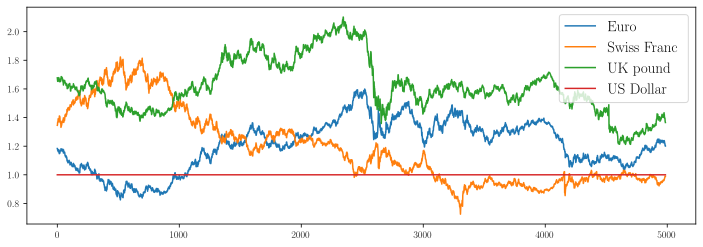

In [11]:
plt.figure(figsize=(12, 4))
legend_size= 15

#plt.plot(australian_dollar, label="Australian Dollar")
#plt.plot(brazilian_real, label="Brazilian Real")
#plt.plot(canadian_dollar, label="Canadian Dollar")
#plt.plot(chinese_yuan, label="Chinese Yuan")
plt.plot(euro, label="Euro")
#plt.plot(indian_rupee, label="Indian Rupee")
#plt.plot(iranian_rial, label="Iranian Rial")
#plt.plot(israeli_sheqel, label="Isreali New Sheqel")
#plt.plot(japanese_yen, label="Japanese Yen")
#plt.plot(korean_won, label="Korean Won")
#plt.plot(malaysian_ringgit, label="Malaysian Ringgit")
#plt.plot(mexican_peso, label="Mexican Peso")
#plt.plot(saudi_arabian_riyal, label="Saudi Arabian Riyal")
#plt.plot(singapore_dollar, label="Singapore Dollar")
#plt.plot(south_african_rand, label="South African Rand")
#plt.plot(swedish_krona, label="Swedish Krona")
plt.plot(swiss_franc, label="Swiss Franc")
#plt.plot(thai_baht, label="Thai Baht")
plt.plot(UK_pound, label="UK pound")
plt.plot(US_dollar, label="US Dollar")

plt.legend(prop={'size': legend_size})
plt.show();

In [12]:
len(US_dollar)

4986

In [13]:
#plot the covariances for the EURO

covariances_ad = []
covariances_emp = []

for index, row in currency_subset_euro_df.iterrows():
    
    z_i = row[['Euro', 'Swiss Franc', 'U.K. Pound Sterling', 'U.S. Dollar']]
    
    #mu_i = z_i.mean()
    mu_i = 0
    x_i = np.outer(z_i - mu_i, z_i - mu_i)
    
    covariances_emp.append(x_i)
    covariances_ad.append(x_i[:,0])

In [14]:
covariances_ad = np.array(covariances_ad)

cov_ad_euro = covariances_ad[:,0]
cov_ad_sf = covariances_ad[:,1]
cov_ad_pound = covariances_ad[:,2]
cov_ad_dollar = covariances_ad[:,3]

n_curr = 4

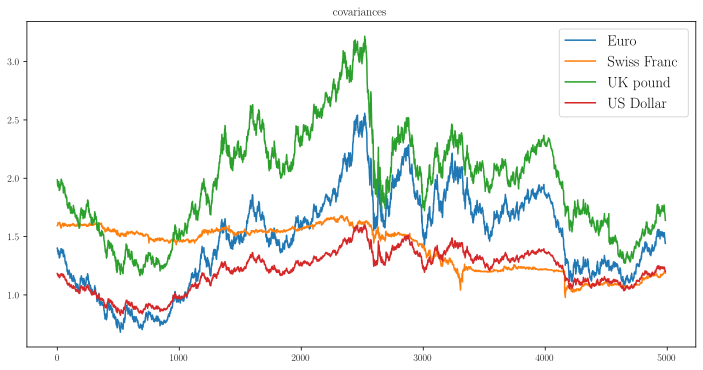

In [15]:
plt.figure(figsize=(12, 6))
legend_size = 15

plt.plot(cov_ad_euro, label="Euro")
plt.plot(cov_ad_sf, label="Swiss Franc")
plt.plot(cov_ad_pound, label="UK pound")
plt.plot(cov_ad_dollar, label="US Dollar")
plt.title("covariances")

plt.legend(prop={'size': legend_size});
plt.show();

# Start calculating

In [16]:
from copy import deepcopy

# specify simple priors
n_0 = 0
Psi_0 = 0.01 * np.eye(n_curr)

n_i = 0
Psi_i = deepcopy(Psi_0)

covs_emp = []
Psis = []
ns = []
mus = [] #compute the means of the values (instead of their covs) for the GWP later on
current_mu = 0

prev_month = 10

for index, row in currency_subset_euro_df.iterrows():
    
    month = row['Month']

    z_i = row[['Euro', 'Swiss Franc', 'U.K. Pound Sterling', 'U.S. Dollar']]
    
    #mu_i = z_i.mean()
    mu_i = 0 
    x_i = np.outer(z_i - mu_i, z_i - mu_i)
    x_i = x_i.astype('float')
    #print("x_i: ", x_i)
    
    #reset when new month starts
    if month != prev_month:
        mus.append(current_mu/n_i)
        #covs_emp.append(Psi_i/n_i)
        covs_emp.append(np.outer(current_mu/n_i, current_mu/n_i))
        current_mu = 0
        
        ns.append(max(n_i, n_curr+1))
        #print("Psi: ", Psi_i)
        Psis.append(Psi_i)
        n_i = n_curr
        Psi_i = deepcopy(Psi_0)
        prev_month = month
        
        
    n_i += 1
    #print(np.shape(x_i))
    Psi_i += x_i
    current_mu += z_i

print(len(ns))
print(len(Psis))
print(len(mus))

235
235
235


(235, 4)


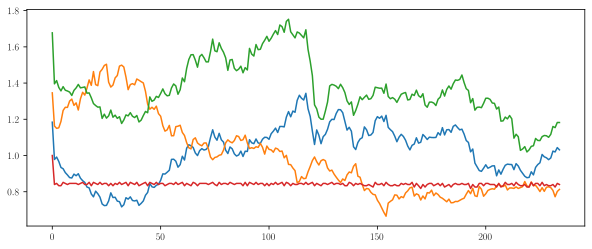

In [17]:
# plot means
print(np.shape(mus))
mus = np.array(mus)

plt.figure(figsize=(10, 4))
plt.plot(mus[:,0])
plt.plot(mus[:,1])
plt.plot(mus[:,2])
plt.plot(mus[:,3])

plt.show();

In [18]:
print(ns[:10])

[5, 25, 26, 24, 24, 27, 26, 25, 26, 26]


In [19]:
print(Psis[:5])

[array([[1.41180864, 1.59351868, 1.98588965, 1.18398   ],
       [1.59351868, 1.82144681, 2.25747807, 1.3459    ],
       [1.98588965, 2.25747807, 2.82333529, 1.6773    ],
       [1.18398   , 1.3459    , 1.6773    , 1.01      ]]), array([[28.48440374, 33.84307206, 40.63160658, 24.45223   ],
       [33.84307206, 40.25350296, 48.2997321 , 29.0684    ],
       [40.63160658, 48.2997321 , 57.99271307, 34.8943    ],
       [24.45223   , 29.0684    , 34.8943    , 21.01      ]]), array([[30.20843176, 35.02957057, 43.06486582, 25.77499   ],
       [35.02957057, 40.6528996 , 49.95499309, 29.9006    ],
       [43.06486582, 49.95499309, 61.42482843, 36.7569    ],
       [25.77499   , 29.9006    , 36.7569    , 22.01      ]]), array([[26.96038832, 32.1196249 , 38.33187306, 23.2156    ],
       [32.1196249 , 38.30377848, 45.68991826, 27.673     ],
       [38.33187306, 45.68991826, 54.53384326, 33.022     ],
       [23.2156    , 27.673     , 33.022     , 20.01      ]]), array([[25.13542765, 31.9602054

In [20]:
# transform all ns and Psis to mus and Sigmas through Laplace Propagation.

from scipy.linalg import expm, sqrtm, logm

def Inv_Wishart_logm_bridge_mu(Psi, v):
    p = np.shape(Psi)[0]
    r = logm(1/(v+p-1) * Psi)
    return(r.reshape(-1))
    
def Inv_Wishart_logm_bridge_Sigma(Psi, v):
    p = np.shape(Psi)[0]
    return(2 * (v+p-1) * np.eye(p**2))

def Inv_Wishart_sqrtm_bridge_mu(Psi, v):
    p = np.shape(Psi)[0]
    r =  sqrtm(1/(v+p)*Psi)
    return(r.reshape(-1))
    
def Inv_Wishart_sqrtm_bridge_Sigma(Psi, v):
    p = np.shape(Psi)[0]
    Psi_inv = np.linalg.inv(Psi)
    Psi_sqrtm = sqrtm(Psi)
    Psi_inv_sqrtm = np.linalg.inv(Psi_sqrtm)
    one = (v+p)**2 * (np.kron(Psi_inv_sqrtm@Psi_inv_sqrtm@Psi_inv_sqrtm, Psi_sqrtm)\
                         + np.kron(Psi_inv, np.eye(p)))

    
    R = np.linalg.inv(one)
    return(R) 


#helper functions
def is_pos_def(x):
    eig = np.linalg.eigvals(x)
    pd = np.all(eig > 0)
    if not pd:
        raise(ValueError("matrix is not positive definite! Matrix: {}; Eigenvalues: {}".format(x, eig)))
    else:
        return(True)

In [21]:
# get individual mus and Sigmas

Y_mu = []
Y_Sigma = []

t0_LM = time.time()
for i, p_ in enumerate(Psis):
    n_ = ns[i]
    mu_ = Inv_Wishart_sqrtm_bridge_mu(p_, n_)
    Sigma_ = Inv_Wishart_sqrtm_bridge_Sigma(p_, n_)
    Y_mu.append(mu_)
    Y_Sigma.append(Sigma_)

t1_LM = time.time()
print("LM timing: ", t1_LM - t0_LM)

print(Y_mu[0])
print(Y_Sigma[0])

LM timing:  0.09155464172363281
[0.2030855  0.19296732 0.24048152 0.14337419 0.19296732 0.25269068
 0.27336955 0.16298191 0.24048152 0.27336955 0.37401447 0.20311282
 0.14337419 0.16298191 0.20311282 0.15442844]
[[ 0.01513842 -0.00183279 -0.00228408 -0.00136176  0.01715155 -0.00206869
  -0.00257806 -0.00153703  0.02137476 -0.00257806 -0.00321285 -0.00191549
   0.01274355 -0.00153703 -0.00191549 -0.00114201]
 [-0.00183279  0.01466727 -0.00259645 -0.00154799 -0.00206869  0.01661976
  -0.00293063 -0.00174723 -0.00257806  0.02071203 -0.00365224 -0.00217745
  -0.00153703  0.01234843 -0.00217745 -0.00129819]
 [-0.00228408 -0.00259645  0.01351494 -0.00192916 -0.00257806 -0.00293063
   0.01531912 -0.00217745 -0.00321285 -0.00365224  0.01909113 -0.0027136
  -0.00191549 -0.00217745  0.01138206 -0.00161784]
 [-0.00136176 -0.00154799 -0.00192916  0.01560056 -0.00153703 -0.00174723
  -0.00217745  0.01767317 -0.00191549 -0.00217745 -0.0027136   0.02202482
  -0.00114201 -0.00129819 -0.00161784  0.013

In [22]:
# Prepare the X data

T = np.arange(1, len(Y_mu)+1)
V = np.arange(1, n_curr + 1)

X = []
for t in T:
    for v1 in V:
        for v2 in V:
            X.append([t, v1, v2])

X = np.array(X)            
print(X[:25])

[[1 1 1]
 [1 1 2]
 [1 1 3]
 [1 1 4]
 [1 2 1]
 [1 2 2]
 [1 2 3]
 [1 2 4]
 [1 3 1]
 [1 3 2]
 [1 3 3]
 [1 3 4]
 [1 4 1]
 [1 4 2]
 [1 4 3]
 [1 4 4]
 [2 1 1]
 [2 1 2]
 [2 1 3]
 [2 1 4]
 [2 2 1]
 [2 2 2]
 [2 2 3]
 [2 2 4]
 [2 3 1]]


(3760, 3760)


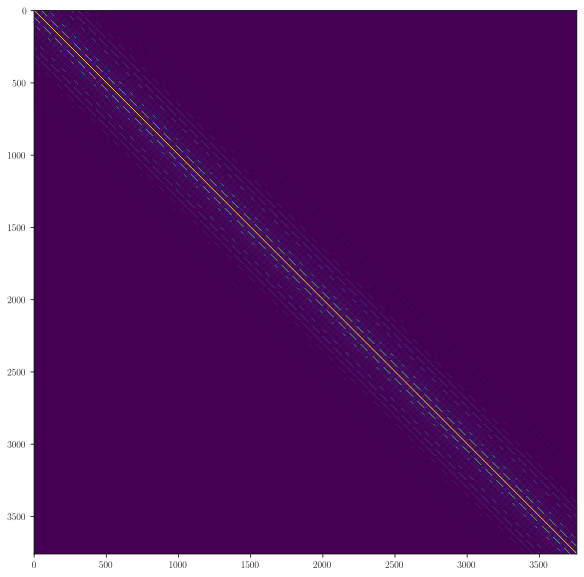

In [23]:
# build the kernel

def k_SEK(x, x_, s=1, l=3):
    return(s*np.exp(-(x-x_)**2 / (2*l**2)))

def k_RQ(x, x_, s=1, l=10, a=0.1):
    return(s**2 * (1 + (x-x_)**2/(2*a*l**2)))**(-a)

def k_OU(x, x_, s=1, l=9):
    return(s**2 * np.exp(-(np.abs(x-x_)/l)))
    
def k_dirac_soft(x, x_):
    if x == x_:
        return(1)
    else:
        return(0.1)
    
n = len(X)
K_XX = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        t_i = X[i,0]
        v1_i = X[i,1]
        v2_i = X[i,2]
        t_j = X[j,0]
        v1_j = X[j,1]
        v2_j = X[j,2]
        K_XX[i, j] = k_OU(t_i, t_j) * k_dirac_soft(v1_i, v1_j) * k_dirac_soft(v2_i, v2_j)

K_XX += 10e-6*np.eye(n) #for numerical issues
        
print(np.shape(K_XX))

plt.figure(figsize=(10,10))
plt.imshow(K_XX)
plt.show();

In [24]:
# prep Y data block

Y_Sigma_block = np.zeros((n,n))
idx = 0
for S in Y_Sigma:
    Y_Sigma_block[idx:idx+n_curr**2, idx:idx+(n_curr**2)] = S
    idx += n_curr**2

In [25]:
print(is_pos_def(K_XX))
print(is_pos_def(Y_Sigma_block))

True
True


In [26]:
# calculate GP stuff
from numpy.random import randn, multivariate_normal
from numpy.linalg import cholesky, solve
from scipy.linalg import cho_solve, cho_factor


G_ = K_XX + Y_Sigma_block
t0_factor = time.time()
G = cho_factor(G_)
t1_factor = time.time()
time_factor = t1_factor - t0_factor
print("time to factor: ", time_factor)

time to factor:  0.26062512397766113


(3760, 3)
[[1. 1. 1.]
 [1. 1. 2.]
 [1. 1. 3.]
 [1. 1. 4.]
 [1. 2. 1.]
 [1. 2. 2.]
 [1. 2. 3.]
 [1. 2. 4.]
 [1. 3. 1.]
 [1. 3. 2.]
 [1. 3. 3.]
 [1. 3. 4.]
 [1. 4. 1.]
 [1. 4. 2.]
 [1. 4. 3.]
 [1. 4. 4.]
 [2. 1. 1.]
 [2. 1. 2.]
 [2. 1. 3.]
 [2. 1. 4.]
 [2. 2. 1.]
 [2. 2. 2.]
 [2. 2. 3.]
 [2. 2. 4.]
 [2. 3. 1.]
 [2. 3. 2.]
 [2. 3. 3.]
 [2. 3. 4.]
 [2. 4. 1.]
 [2. 4. 2.]]
(3760, 3760)
(3760, 3760)


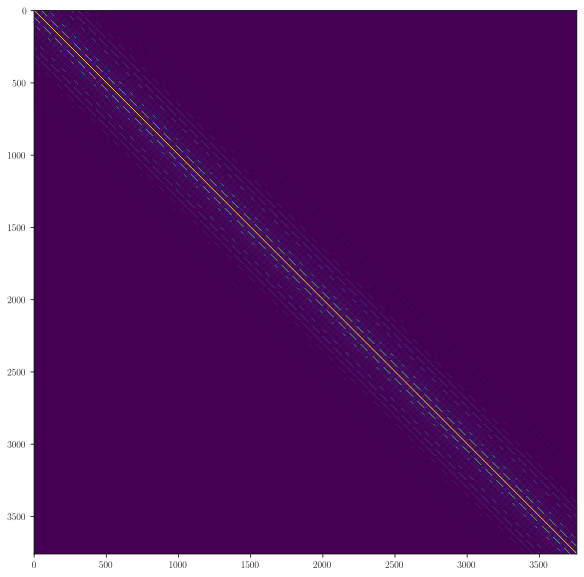

In [27]:
# create x, K_xx, K_xX

T_x = np.arange(1, 235+1) #just take the exact same range again
test_len = 235+10
#T_x = np.arange(1, test_len+1) #add 10 testpoints 

x = np.zeros((len(T_x) * len(V)**2, 3))
print(np.shape(x))
idx = 0
for t in T_x:
    for v1 in V:
        for v2 in V:
            x[idx] = [t, v1, v2]
            idx += 1
            
print(x[:30])

n_ = len(x)
K_xX = np.zeros((n_, n))
for i in range(n_):
    for j in range(n):
        t_i = x[i,0]
        v1_i = x[i,1]
        v2_i = x[i,2]
        t_j = X[j,0]
        v1_j = X[j,1]
        v2_j = X[j,2]
        K_xX[i, j] = k_OU(t_i, t_j) * k_dirac_soft(v1_i, v1_j) * k_dirac_soft(v2_i, v2_j)
        
print(np.shape(K_xX))

K_xx = np.zeros((n_, n_))
for i in range(n_):
    for j in range(n_):
        t_i = x[i,0]
        v1_i = x[i,1]
        v2_i = x[i,2]
        t_j = x[j,0]
        v1_j = x[j,1]
        v2_j = x[j,2]
        K_xx[i, j] = k_OU(t_i, t_j, s=1.002) * k_dirac_soft(v1_i, v1_j) * k_dirac_soft(v2_i, v2_j)


K_xx += np.eye(n_) * 1e-6

print(np.shape(K_xx))
plt.figure(figsize=(10,10))
plt.imshow(K_xx)
plt.show();

In [28]:
# do some inference
t0_solve = time.time()
A = cho_solve(G, K_xX.T).T
t1_solve = time.time()
time_solve = t1_solve - t0_solve
print("time to solve: ", time_solve)

Y_mu = np.array(Y_mu).reshape(-1)

out = {}

n_GP_samples = 50

# # posterior p(f_x|Y) = N(f_x,mpost,vpost)
t0_mu = time.time()
out["mpost"] = A @ Y_mu #m(x) + A @ (Y - mX)  # mean
t1_mu = time.time()
time_mu = t1_mu - t0_mu
print("time to compute mu: ", time_mu)

t0_cov = time.time()
out["vpost"] = K_xx - A @ K_xX.T  # covariance
t1_cov = time.time()
time_cov = t1_cov - t0_cov
print("time to compute Sigma: ", time_cov)

print("time for inference: ", time_factor + time_solve + time_mu + time_cov)

out["spost"] = multivariate_normal(
    out["mpost"].flatten(), out["vpost"], size=n_GP_samples
).T

time to solve:  0.9007322788238525
time to compute mu:  0.016713619232177734
time to compute Sigma:  0.7905035018920898
time for inference:  1.9685745239257812


In [29]:
print(np.shape(out["mpost"]))
print(np.shape(out["vpost"]))
print(np.shape(out["spost"]))

(3760,)
(3760, 3760)
(3760, 50)


In [30]:
# transform back and have a look

test_m = out["mpost"].reshape(-1, n_curr, n_curr)
matrices_back = []
for y in test_m:
    y_sqr = y@y.T + np.eye(n_curr) * 10e-8
    is_pos_def(y_sqr)
    matrices_back.append(y_sqr)
    
test_v = out["vpost"].diagonal().reshape(-1, n_curr, n_curr)
variances_back = []
for v in test_v:
    v_sqr = v@v.T + np.eye(n_curr) * 10e-8
    is_pos_def(v_sqr)
    variances_back.append(v_sqr)

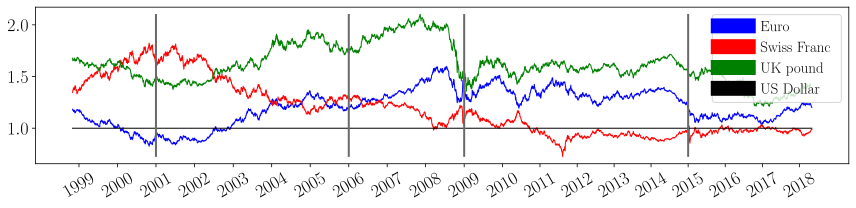

In [31]:
# plot the results

fig = plt.figure(figsize=(12,3))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=18)
plt.rc('xtick', labelsize=18)
plt.rc('axes', labelsize=18)

lw = 1
legend_size = 15

plt.plot(euro, label="Euro", color='blue', lw=lw)
plt.plot(swiss_franc, label="Swiss Franc", color='red', lw=lw)
plt.plot(UK_pound, label="UK pound", color='green', lw=lw)
plt.plot(US_dollar, label="US Dollar", color='black', lw=lw)

y_min, y_max= 0.05, 0.95
# 2001
plt.axvline(year_idxs[1:][2], ymin=y_min, ymax=y_max, color='dimgrey', lw=2)
# 2006
plt.axvline(year_idxs[1:][7], ymin=y_min, ymax=y_max, color='dimgrey', lw=2)
# 2009
plt.axvline(year_idxs[1:][10], ymin=y_min, ymax=y_max, color='dimgrey', lw=2)
# 2015
plt.axvline(year_idxs[1:][16], ymin=y_min, ymax=y_max, color='dimgrey', lw=2)

plt.xticks(year_idxs[1:], year_labels[1:], rotation=30)

leg = plt.legend(prop={'size': legend_size}) 
# set the linewidth of each legend object
for legobj in leg.legendHandles:
    legobj.set_linewidth(15.0)

plt.tight_layout()
#"""
tpl.save(
    "currencies.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""
plt.savefig('currencies.pdf')
plt.show();

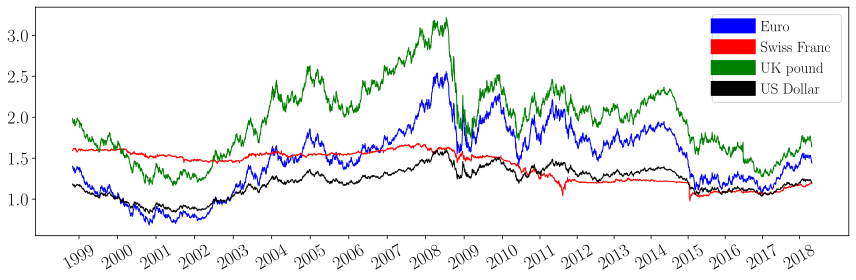

In [32]:
# plot the results

plt.figure(figsize=(12,4))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=18)
plt.rc('xtick', labelsize=18)
plt.rc('axes', labelsize=18)

lw = 1
legend_size = 15


plt.plot(cov_ad_euro, label="Euro", color='blue', lw=lw)
plt.plot(cov_ad_sf, label="Swiss Franc", color='red', lw=lw)
plt.plot(cov_ad_pound, label="UK pound", color='green', lw=lw)
plt.plot(cov_ad_dollar, label="US Dollar", color='black', lw=lw)

plt.xticks(year_idxs[1:], year_labels[1:], rotation=30)

leg = plt.legend(prop={'size': legend_size}) 
# set the linewidth of each legend object
for legobj in leg.legendHandles:
    legobj.set_linewidth(15.0)

plt.tight_layout()
plt.savefig('currency_covariances.pdf')
plt.show();

In [33]:
print(covariances_emp[0])

[[1.4018086404 1.5935186820000002 1.9858896540000002 1.18398]
 [1.5935186820000002 1.8114468100000003 2.2574780700000003 1.3459]
 [1.9858896540000002 2.2574780700000003 2.81333529 1.6773]
 [1.18398 1.3459 1.6773 1.0]]


(4986, 4, 4)


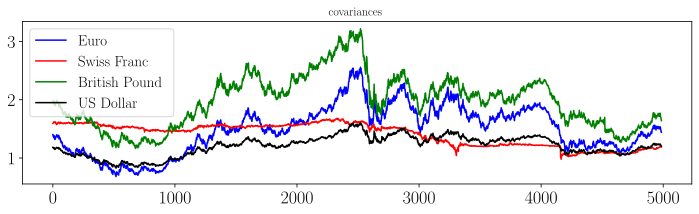

In [34]:
# plot empirical covariances
print(np.shape(covariances_emp))
covariances_emp = np.array(covariances_emp).astype(float)
corr_emp = np.zeros_like(covariances_emp)

# compute empirical covariances
cov_emp_euro = covariances_emp[:,0,0]
cov_emp_sf = covariances_emp[:,0,1]
cov_emp_bp = covariances_emp[:,0,2]
cov_emp_usd = covariances_emp[:,0,3]
        
plt.figure(figsize=(12, 3))
legend_size = 15

#plt.plot(corr_emp_euro, label="emp_0")
plt.plot(cov_emp_euro, label="Euro", color='blue')
plt.plot(cov_emp_sf, label="Swiss Franc", color='red')
plt.plot(cov_emp_bp, label="British Pound", color='green')
plt.plot(cov_emp_usd, label="US Dollar", color='black')
plt.title("covariances")

plt.legend(prop={'size': legend_size});
plt.show();

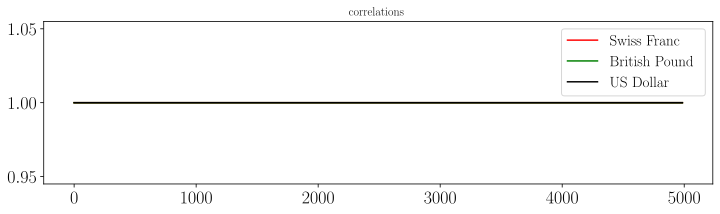

In [35]:
# compute the empirical correlations from the empirical covariances in a smart numpy way
for i in range(np.shape(covariances_emp)[-1]):
    for j in range(np.shape(covariances_emp)[-1]):
        corr_emp[:, i, j] = covariances_emp[:,i,j] / (np.sqrt(covariances_emp[:,i,i]) * np.sqrt(covariances_emp[:,j,j]))

# plot the results and compare with above
cov_emp_euro = covariances_emp[:,0,0]
cov_emp_sf = covariances_emp[:,0,1]
cov_emp_bp = covariances_emp[:,0,2]
cov_emp_usd = covariances_emp[:,0,3]
        
# plot the results and compare with above
corr_emp_euro = corr_emp[:,0,0]
corr_emp_sf = corr_emp[:,0,1]
corr_emp_bp = corr_emp[:,0,2]
corr_emp_usd = corr_emp[:,0,3]

plt.figure(figsize=(12, 3))
legend_size = 15

#plt.plot(corr_emp_euro, label="emp_0")
plt.plot(corr_emp_sf, label="Swiss Franc", color='red')
plt.plot(corr_emp_bp, label="British Pound", color='green')
plt.plot(corr_emp_usd, label="US Dollar", color='black')
plt.title("correlations")

plt.legend(prop={'size': legend_size});
plt.show();

(235, 4, 4)
(235, 4, 4)


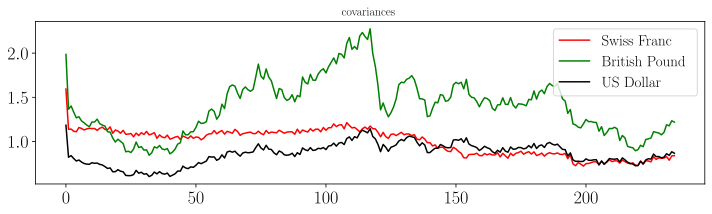

In [36]:
# plot empirical correlations from the Psis instead of every day
print(np.shape(Psis))
#Psis_emp = np.array(Psis)#.astype(float)
covs_emp = np.array(covs_emp).astype(float)
corr_emp = np.zeros_like(covs_emp)
print(np.shape(covs_emp))

# compute the empirical correlations from the empirical covariances in a smart numpy way
#for i in range(np.shape(Psis_emp)[-1]):
#    for j in range(np.shape(Psis_emp)[-1]):
#        corr_emp[:, i, j] = Psis_emp[:,i,j] / (np.sqrt(Psis_emp[:,i,i]) * np.sqrt(Psis_emp[:,j,j]))

for i in range(np.shape(covs_emp)[-1]):
    for j in range(np.shape(covs_emp)[-1]):
        corr_emp[:, i, j] = covs_emp[:,i,j] / (np.sqrt(covs_emp[:,i,i]) * np.sqrt(covs_emp[:,j,j]))

        
# plot the results and compare with above
cov_emp_euro = covs_emp[:,0,0]
cov_emp_sf = covs_emp[:,0,1]
cov_emp_bp = covs_emp[:,0,2]
cov_emp_usd = covs_emp[:,0,3]
        
plt.figure(figsize=(12, 3))
legend_size = 15

#plt.plot(corr_emp_euro, label="emp_0")
plt.plot(cov_emp_sf, label="Swiss Franc", color='red')
plt.plot(cov_emp_bp, label="British Pound", color='green')
plt.plot(cov_emp_usd, label="US Dollar", color='black')
plt.title("covariances")

plt.legend(prop={'size': legend_size});
plt.show();

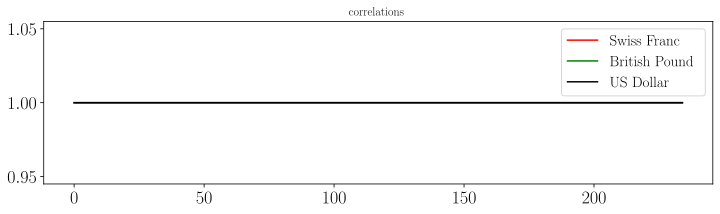

In [37]:
# plot the results and compare with above
corr_emp_euro = corr_emp[:,0,0]
corr_emp_sf = corr_emp[:,0,1]
corr_emp_bp = corr_emp[:,0,2]
corr_emp_usd = corr_emp[:,0,3]

plt.figure(figsize=(12, 3))
legend_size = 15

#plt.plot(corr_emp_euro, label="emp_0")
plt.plot(corr_emp_sf, label="Swiss Franc", color='red')
plt.plot(corr_emp_bp, label="British Pound", color='green')
plt.plot(corr_emp_usd, label="US Dollar", color='black')
plt.title("correlations")

plt.legend(prop={'size': legend_size});
plt.show();

In [38]:
matrices_back = np.array(matrices_back)
x1 = matrices_back[:,0,0]
x2 = matrices_back[:,0,1]
x3 = matrices_back[:,0,2]
x4 = matrices_back[:,0,3]

variances_back = np.array(variances_back)
v1 = np.sqrt(variances_back[:,0,0])
v2 = np.sqrt(variances_back[:,0,1])
v3 = np.sqrt(variances_back[:,0,2])
v4 = np.sqrt(variances_back[:,0,3])

In [39]:
# show the covariances at specific points in time

# 2001
cov_2001 = matrices_back[2 + 2*12]
cov_2006 = matrices_back[2 + 7*12]
cov_2009 = matrices_back[2 + 10*12]
cov_2015 = matrices_back[2 + 16*12]

<Figure size 864x288 with 0 Axes>

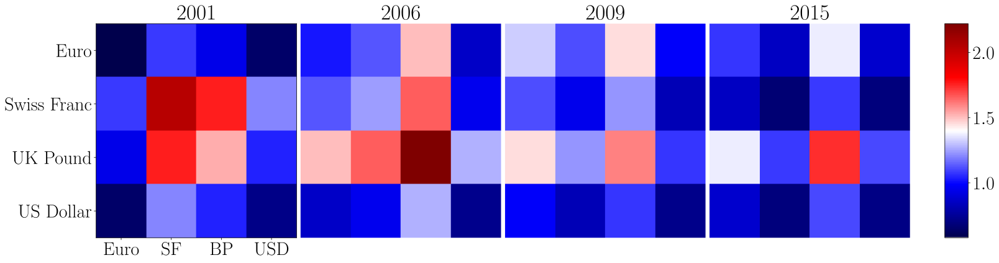

In [40]:
# plot the four matrices as heatmaps

plt.figure(figsize=(12,4))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=30)
plt.rc('xtick', labelsize=30)
plt.rc('axes', labelsize=30)

title_size=35


titles = ['2001', '2006', '2009', '2015']

ticks = [0, 1, 2, 3]
ylabels = ['Euro', 'Swiss Franc', 'UK Pound', 'US Dollar']
xlabels = ['Euro', 'SF', 'BP', 'USD']

fig, axs = plt.subplots(nrows=1, ncols=4, sharex=False, figsize=(26,6))
covs = [cov_2001, cov_2006, cov_2009, cov_2015]


v_min = np.array(covs).min()
v_max = np.array(covs).max()

for i, ax in enumerate(axs.flat):
    if i == 0:
        #label the axis
        ax.set_yticks(ticks)
        ax.set_yticklabels(ylabels)
        ax.set_xticks(ticks)
        ax.set_xticklabels(xlabels)
    else:
        ax.set_axis_off()
        
    ax.set_title(titles[i], size=title_size)
    im = ax.imshow(covs[i], vmin=v_min, vmax=v_max, aspect='auto', cmap='seismic') #RdGy, bwr, RdBu, coolwarm, seismic
    
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
cbar = fig.colorbar(im, cax=cb_ax)

# plt.tight_layout() don't use tight_layout here.
plt.savefig('selected_covs.pdf', bbox_inches='tight')
plt.show();

In [41]:
cov_samples = out["spost"]
print(np.shape(cov_samples))

cov_samples = np.swapaxes(cov_samples, 0, 1)
cov_samples = cov_samples.reshape(n_GP_samples, -1, n_curr, n_curr,)
print(np.shape(cov_samples))

cov_samples_sqr = np.zeros_like(cov_samples)
for i in range(n_GP_samples):
    for j in range(cov_samples.shape[1]):
        X_ = cov_samples[i, j, :, :]
        X_2 =  X_ @ X_.T 
        is_pos_def(X_2)
        cov_samples_sqr[i, j, :, :] = X_2

print(np.shape(cov_samples_sqr))
print(cov_samples_sqr[-1, -1, :, :])

(3760, 50)
(50, 235, 4, 4)
(50, 235, 4, 4)
[[0.89624884 0.7372928  1.03470318 0.6675438 ]
 [0.7372928  0.6271139  0.87734352 0.55924214]
 [1.03470318 0.87734352 1.23473604 0.78665955]
 [0.6675438  0.55924214 0.78665955 0.50510563]]


In [42]:
# draw 4 samples per year and plot them 

cov_samples_2001 = cov_samples_sqr[:4, 2 + 2*12, : ,:]
cov_samples_2006 = cov_samples_sqr[:4, 2 + 7*12, : ,:]
cov_samples_2009 = cov_samples_sqr[:4, 2 + 10*12, : ,:]
cov_samples_2015 = cov_samples_sqr[:4, 2 + 16*12, : ,:]
print(cov_samples_2001.shape)
print(v_min, v_max)

(4, 4, 4)
0.5791952410087996 2.221331080401967


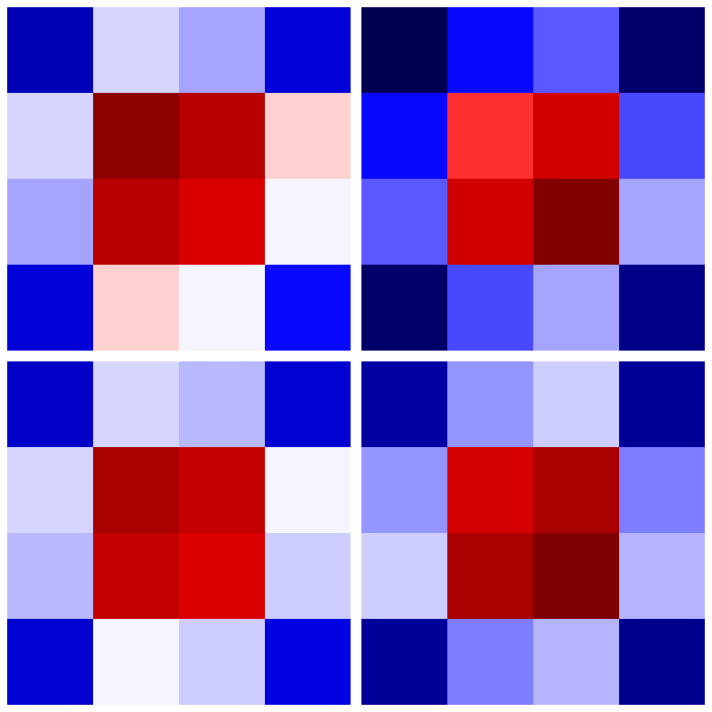

In [43]:
fig, axs = plt.subplots(nrows=2, ncols=2, sharex=False, figsize=(10, 10))

for i, ax in enumerate(axs.flat):
    ax.set_axis_off()
        
    #print(cov_samples_2001[i])
    im = ax.imshow(cov_samples_2001[i], vmin=v_min, vmax=v_max, aspect='auto', cmap='seismic')

plt.tight_layout()
plt.savefig('selected_cos_samples_2001.pdf')

plt.show();

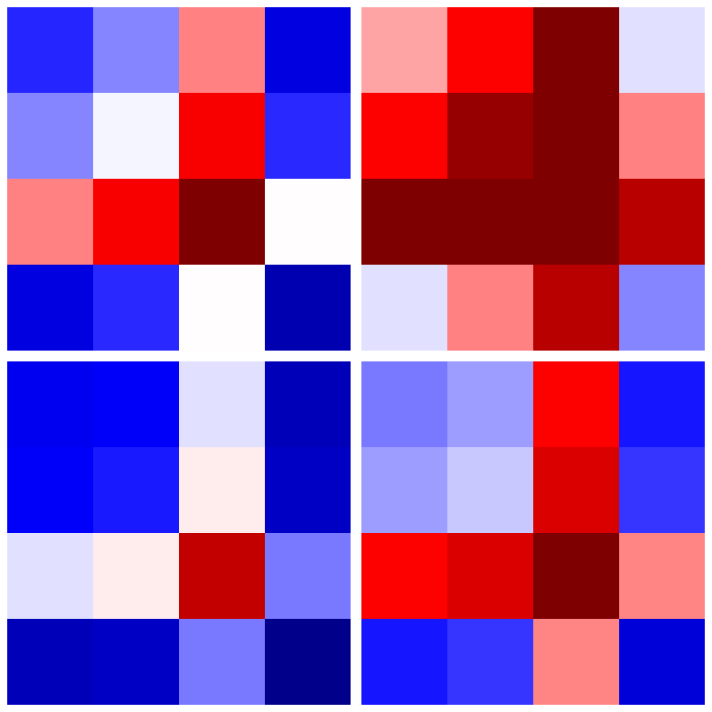

In [44]:
fig, axs = plt.subplots(nrows=2, ncols=2, sharex=False, figsize=(10, 10))

for i, ax in enumerate(axs.flat):
    ax.set_axis_off()

    im = ax.imshow(cov_samples_2006[i], vmin=v_min, vmax=v_max, aspect='auto', cmap='seismic')

plt.tight_layout()
plt.savefig('selected_cos_samples_2006.pdf')

plt.show();

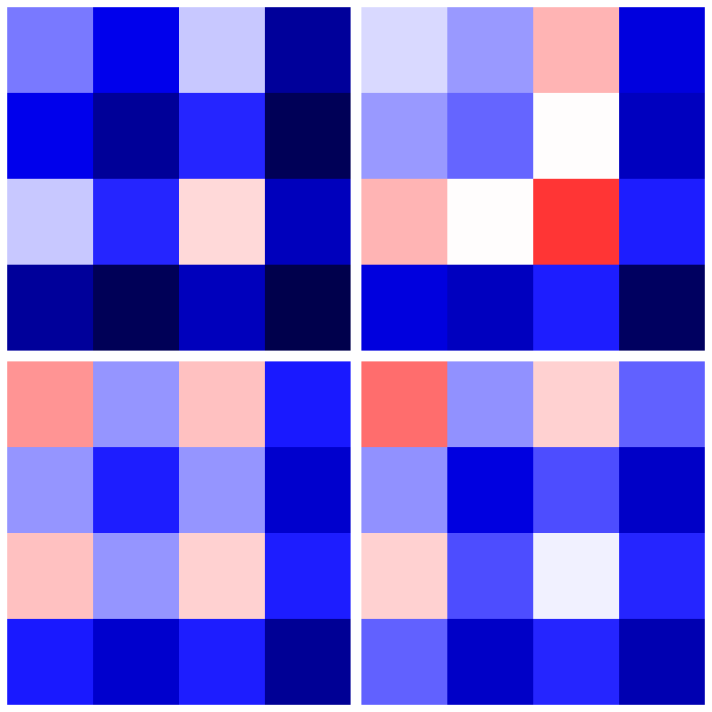

In [45]:
fig, axs = plt.subplots(nrows=2, ncols=2, sharex=False, figsize=(10, 10))

for i, ax in enumerate(axs.flat):
    ax.set_axis_off()

    im = ax.imshow(cov_samples_2009[i], vmin=v_min, vmax=v_max, aspect='auto', cmap='seismic')

plt.tight_layout()
plt.savefig('selected_cos_samples_2009.pdf')

plt.show();

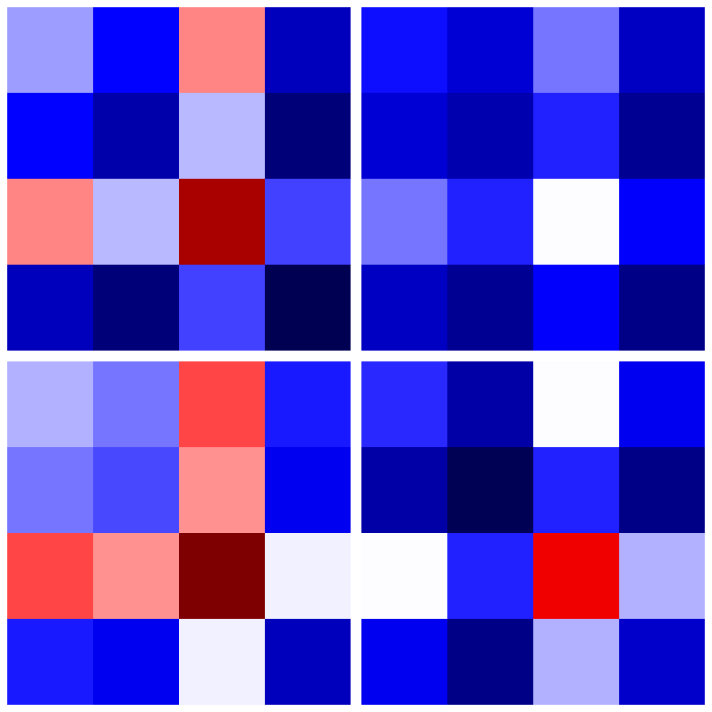

In [46]:
fig, axs = plt.subplots(nrows=2, ncols=2, sharex=False, figsize=(10, 10))

for i, ax in enumerate(axs.flat):
    ax.set_axis_off()
    
    im = ax.imshow(cov_samples_2015[i], vmin=v_min, vmax=v_max, aspect='auto', cmap='seismic')

plt.tight_layout()
plt.savefig('selected_cos_samples_2015.pdf')

plt.show();

In [47]:
year_months_idxs = np.arange(0+2, 235+12+2, 12)

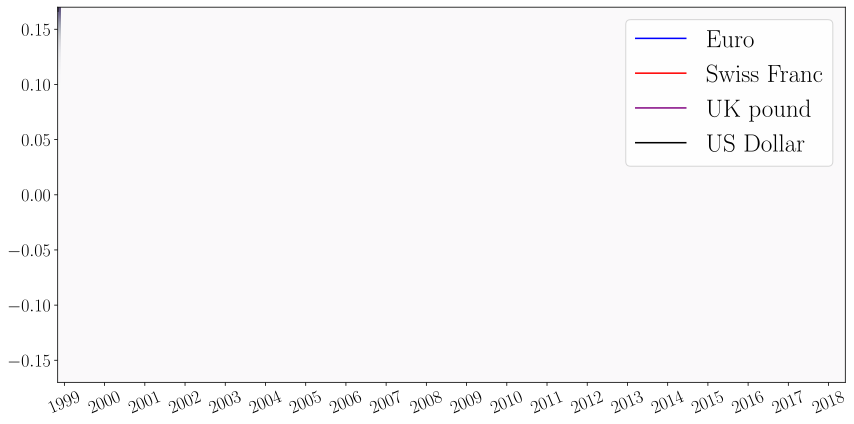

In [48]:
# plot Gaussians

plt.figure(figsize=(12,6))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=18)
plt.rc('xtick', labelsize=18)
plt.rc('axes', labelsize=18)


plt.plot(x1, label="Euro", color='blue')
plt.plot(x2, label="Swiss Franc", color='red')
plt.plot(x3, label="UK pound", color='purple')
plt.plot(x4, label="US Dollar", color='black')

plt.xticks(year_months_idxs, year_labels[1:], rotation = 23)

margin = 0.17

def GaussPDFscaled(y, m, s):  # shading
    return np.exp(-0.5 * (y - m.T) ** 2 / (s ** 2).T)


yy = np.linspace(-margin, margin, 1000).reshape([1000, 1])

Ppost1 = GaussPDFscaled(
    yy, x1, v1
)  # shading by local marginal pdf

Ppost2 = GaussPDFscaled(
    yy, x2, v2
)  # shading by local marginal pdf

Ppost3 = GaussPDFscaled(
    yy, x3, v3
)  # shading by local marginal pdf

Ppost4 = GaussPDFscaled(
    yy, x4, v4
)  # shading by local marginal pdf

plt.imshow(
    Ppost1,
    extent=[0, 235, -margin, margin],
    aspect="auto",
    origin="lower",
    cmap="Blues",
    alpha=0.8,
)

plt.imshow(
    Ppost2,
    extent=[0, 235, -margin, margin],
    aspect="auto",
    origin="lower",
    cmap="Reds",
    alpha=0.5,
)


plt.imshow(
    Ppost3,
    extent=[0, 235, -margin, margin],
    aspect="auto",
    origin="lower",
    cmap="Purples",
    alpha=0.4,
)

plt.imshow(
    Ppost4,
    extent=[0, 235, -margin, margin],
    aspect="auto",
    origin="lower",
    cmap="Greys",
    alpha=0.3,
)



plt.legend(prop={'size': 25})
plt.tight_layout()
plt.savefig('currency_covariances_GP.pdf')
plt.show();

## Plot the correlation coefficients for the Swiss Franc, the UK Pound and the US Dollar with the EURO for many samples

In [49]:
#choose only the first row correlations (without the correlation for the Euro itself)
cov_samples_euro = cov_samples_sqr[:, :, 0, :]
cov_samples_euro_mean = cov_samples_euro.mean(0)
cov_samples_euro_std = cov_samples_euro.std(0)

cov_samples_euro_mean_var = cov_samples_euro_mean[:,0]
cov_samples_euro_mean_sf = cov_samples_euro_mean[:,1]
cov_samples_euro_mean_bp = cov_samples_euro_mean[:,2]
cov_samples_euro_mean_usd = cov_samples_euro_mean[:,3]

cov_samples_euro_std_var = cov_samples_euro_std[:,0]
cov_samples_euro_std_sf = cov_samples_euro_std[:,1]
cov_samples_euro_std_bp = cov_samples_euro_std[:,2]
cov_samples_euro_std_usd = cov_samples_euro_std[:,3]

In [50]:
print(cov_samples_sqr[-1, -1, :, :])

#calculate the correlation coefficients for all matrices
corr_samples = np.zeros_like(cov_samples_sqr)
for i in range(n_curr):
    for j in range(n_curr):
        corr_samples[:, :, i, j] = cov_samples_sqr[:, :, i, j]/(np.sqrt(cov_samples_sqr[:, :, i, i] * cov_samples_sqr[:, :, j, j]))

print(corr_samples[-1, -1, :, :])

#choose only the first row correlations (without the correlation for the Euro itself)
corr_samples_euro = np.zeros((n_GP_samples, corr_samples.shape[1], n_curr-1))
corr_samples_euro = corr_samples[:, :, 0, 1:n_curr]
corr_samples_euro_mean = corr_samples_euro.mean(0)
corr_samples_euro_std = corr_samples_euro.std(0)

corr_samples_euro_mean_sf = corr_samples_euro_mean[:,0]
corr_samples_euro_mean_bp = corr_samples_euro_mean[:,1]
corr_samples_euro_mean_usd = corr_samples_euro_mean[:,2]

corr_samples_euro_std_sf = corr_samples_euro_std[:,0]
corr_samples_euro_std_bp = corr_samples_euro_std[:,1]
corr_samples_euro_std_usd = corr_samples_euro_std[:,2]

[[0.89624884 0.7372928  1.03470318 0.6675438 ]
 [0.7372928  0.6271139  0.87734352 0.55924214]
 [1.03470318 0.87734352 1.23473604 0.78665955]
 [0.6675438  0.55924214 0.78665955 0.50510563]]
[[1.         0.98345043 0.98359071 0.9921432 ]
 [0.98345043 1.         0.99703269 0.99365488]
 [0.98359071 0.99703269 1.         0.9961131 ]
 [0.9921432  0.99365488 0.9961131  1.        ]]


In [51]:
corr_samples_euro_sf = corr_samples_euro[:,:,0]
corr_samples_euro_bp = corr_samples_euro[:,:,1]
corr_samples_euro_usd = corr_samples_euro[:,:,2]

x = T_x

In [52]:
var_samples_euro = cov_samples_euro[:,:,0]
cov_samples_euro_sf = cov_samples_euro[:,:,1]
cov_samples_euro_bp = cov_samples_euro[:,:,2]
cov_samples_euro_usd = cov_samples_euro[:,:,3]

x = T_x

(50, 235)


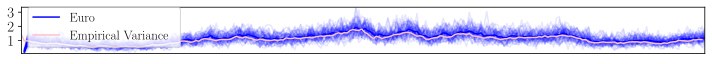

In [64]:
# plot the variances for EURO

fig = plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=13

print(var_samples_euro.shape)
for s in var_samples_euro:
    plt.plot(x, s, alpha=0.1, color='blue');

plt.plot(x, cov_samples_euro_mean_var, alpha=1, color='blue', label='Euro') 
plt.xticks([])
plt.margins(0,0)

#plot empirical correlations in blue
plt.plot(cov_emp_euro, label="Empirical Variance", color='pink')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
#"""
tpl.save(
    "currency_var_samples_euro.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""
plt.savefig('currency_var_samples_euro.pdf')
plt.show();

(50, 235)


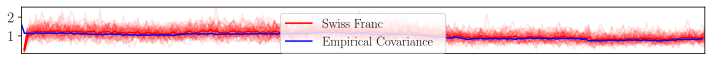

In [63]:
# plot the covariances for Swiss Franc

fig = plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=13

print(cov_samples_euro_sf.shape)
for s in cov_samples_euro_sf:
    plt.plot(x, s, alpha=0.1, color='red');

plt.plot(x, cov_samples_euro_mean_sf, alpha=1, color='red', label='Swiss Franc') 
plt.xticks([])
plt.margins(0,0)

#plot empirical correlations in blue
plt.plot(cov_emp_sf, label="Empirical Covariance", color='blue')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
#"""
tpl.save(
    "currency_cov_samples_SF.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""
plt.savefig('currency_cov_samples_SF.pdf')
plt.show();

(50, 235)


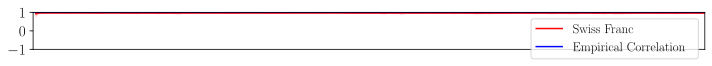

In [55]:
# plot the correlations for Swiss Franc

plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=13

print(corr_samples_euro_sf.shape)
for s in corr_samples_euro_sf:
    plt.plot(x, s, alpha=0.1, color='red');

plt.plot(x, corr_samples_euro_mean_sf, alpha=1, color='red', label='Swiss Franc') 
plt.xticks([])
plt.ylim(-1,1)
plt.margins(0,0)

#plot empirical correlations in blue
plt.plot(corr_emp_sf, label="Empirical Correlation", color='blue')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
plt.savefig('currency_corr_samples_SF.pdf')
plt.show();

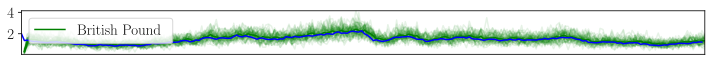

In [62]:
# plot for British Pound covs

fig = plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=15


for s in cov_samples_euro_bp:
    plt.plot(x, s, alpha=0.1, color='green');

plt.plot(x, cov_samples_euro_mean_bp, alpha=1, color='green', label='British Pound') 
plt.xticks([])
#plt.ylim(-1,1)
plt.margins(0,0)

# compare to empirical correlation in blue
plt.plot(cov_emp_bp, color='blue')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
#"""
tpl.save(
    "currency_cov_samples_BP.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""
plt.savefig('currency_cov_samples_BP.pdf')
plt.show();

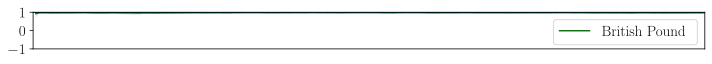

In [57]:
# plot for British Pound

plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=15


for s in corr_samples_euro_bp:
    plt.plot(x, s, alpha=0.1, color='green');

plt.plot(x, corr_samples_euro_mean_bp, alpha=1, color='green', label='British Pound') 
plt.xticks([])
plt.ylim(-1,1)
plt.margins(0,0)

# compare to empirical correlation in blue
plt.plot(corr_emp_bp, color='blue')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
plt.savefig('currency_corr_samples_BP.pdf')
plt.show();

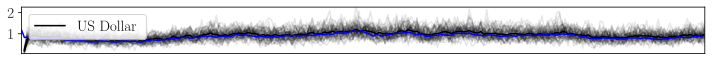

In [61]:
# plot for US Dollar

fig = plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=15

for s in cov_samples_euro_usd:
    plt.plot(x, s, alpha=0.1, color='black');

plt.plot(x, cov_samples_euro_mean_usd, alpha=1, color='black', label='US Dollar') 
plt.xticks([])
plt.margins(0,0)

#compare to empirical correlation in blue
plt.plot(cov_emp_usd, color='blue')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
#"""
tpl.save(
    "currency_cov_samples_USD.tex",
    figure = fig,
    axis_width = "\\figwidth",
    axis_height= "\\figheight",
    tex_relative_path_to_data=".",
    override_externals=True,
    float_format=".3g"
)
#"""
plt.savefig('currency_cov_samples_USD.pdf')
plt.show();

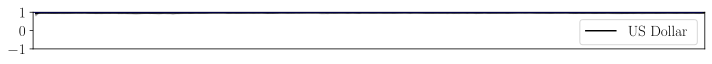

In [60]:
# plot for US Dollar

plt.figure(figsize=(10, 1))
plt.rc('text', usetex=True)
plt.rc('ytick', labelsize=15)
plt.rc('xtick', labelsize=15)
plt.rc('axes', labelsize=15)

legend_size=15

for s in corr_samples_euro_usd:
    plt.plot(x, s, alpha=0.1, color='black');

plt.plot(x, corr_samples_euro_mean_usd, alpha=1, color='black', label='US Dollar') 
plt.xticks([])
plt.ylim(-1,1)
plt.margins(0,0)

#compare to empirical correlation in blue
plt.plot(corr_emp_usd, color='blue')

plt.legend(prop={'size': legend_size})
plt.tight_layout()
plt.savefig('currency_corr_samples_USD.pdf')
plt.show();

# Compare to Generalized Wishart Process

In [67]:
from model.gwp_mine import GeneralizedWishartProcess as GWP
from model.kernels_mine import squared_exponential as se
from model.kernels_mine import periodic as pe
from model.kernels_mine import ou 
from model.kernels_mine import linear as li 
from model.kernels_mine import rational_quadratic as rq
import time
%matplotlib inline
np.random.seed(42)

(4, 235)


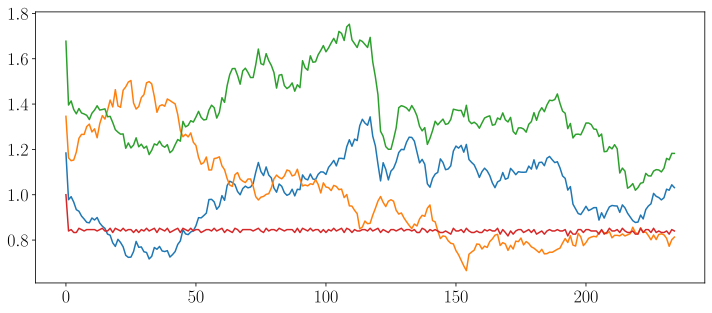

In [68]:
# playing around

N_train = 235

train_data = np.array(mus).T[:, 0:N_train] #235
print(np.shape(train_data))

plt.figure(figsize=(12, 5))
for i in range(np.shape(train_data)[0]):
    plt.plot(train_data[i, :])
    
plt.show();

In [69]:
# prepare the empirical comparisons for later

cov_emp_train = []
for z_i in train_data.T:
    
    #mu_i = z_i.mean()
    mu_i = 0
    x_i = np.outer((z_i - mu_i), (z_i - mu_i))
    cov_emp_train.append(x_i)
    
cov_emp_train = np.array(cov_emp_train).astype(float)
print(np.shape(cov_emp_train))

(235, 4, 4)


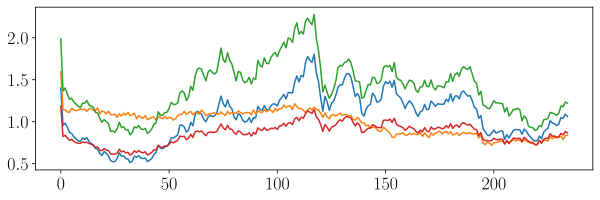

In [70]:
# plot empirical covariance of training samples
cov_samples_emp_0 = cov_emp_train[:,0,0]
cov_samples_emp_1 = cov_emp_train[:,0,1]
cov_samples_emp_2 = cov_emp_train[:,0,2]
cov_samples_emp_3 = cov_emp_train[:,0,3]

plt.figure(figsize=(10, 3))

plt.plot(cov_samples_emp_0)
plt.plot(cov_samples_emp_1)
plt.plot(cov_samples_emp_2)
plt.plot(cov_samples_emp_3)

plt.show();

(235, 4, 4)


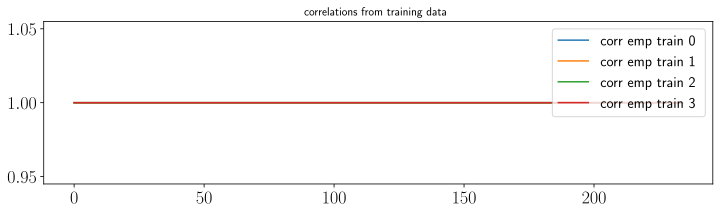

In [71]:
# plot empirical correlation of training samples

print(np.shape(cov_emp_train))
corr_emp_train = np.zeros_like(cov_emp_train)

# compute the empirical correlations from the empirical covariances in a smart numpy way
for i in range(np.shape(cov_emp_train)[-1]):
    for j in range(np.shape(cov_emp_train)[-1]):
        corr_emp_train[:, i, j] = cov_emp_train[:,i,j] / (np.sqrt(cov_emp_train[:,i,i]) * np.sqrt(cov_emp_train[:,j,j]))
        

# plot the results and compare with above
corr_emp_train_0 = corr_emp_train[:,0,0]
corr_emp_train_1 = corr_emp_train[:,0,1]
corr_emp_train_2 = corr_emp_train[:,0,2]
corr_emp_train_3 = corr_emp_train[:,0,3]

plt.figure(figsize=(12, 3))
legend_size = 15

plt.plot(corr_emp_train_0, label="corr emp train 0")
plt.plot(corr_emp_train_1, label="corr emp train 1")
plt.plot(corr_emp_train_2, label="corr emp train 2")
plt.plot(corr_emp_train_3, label="corr emp train 3")
plt.title("correlations from training data")

plt.legend(prop={'size': legend_size});
plt.show();

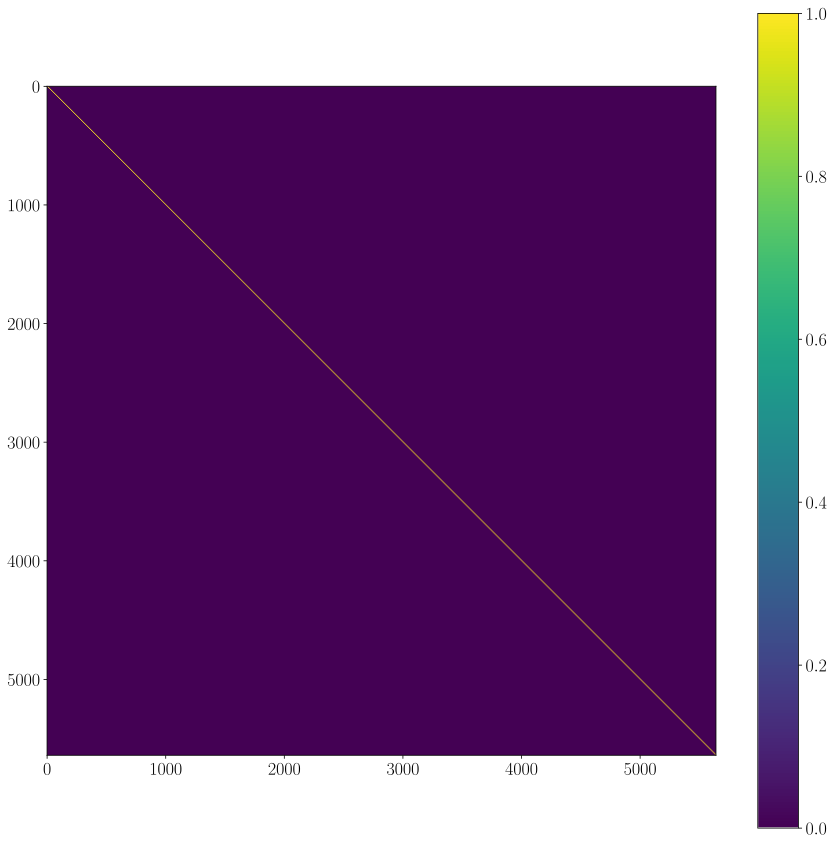

Logtau: (48,); [ 0.01426255  0.13720453 -0.15656956 -0.08783687  0.07652028 -0.15257936
  0.13035816  0.12663195 -0.02801272  0.08708913 -0.11160144 -0.09866382
  0.01351148  0.12630515 -0.02078045  0.01635707 -0.02099561  0.18824249
 -0.06604868  0.03445869 -0.07202985  0.01007554  0.03742005 -0.04090858
  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.        ]
L: (4, 4); [[ 0.2866964   0.          0.          0.        ]
 [-0.16309821  0.10543225  0.          0.        ]
 [ 0.08450612 -0.11843618  0.15719388  0.        ]
 [ 0.12093989 -0.08885709  0.04501317  0.03111024]]
Iter 0: loglik = -47936212.01, log P(u|...) = -8766256.15, log P(tau|...) = -2993.71, log P(L|...) = -533225.09
Logtau: (48,); [-0.60383934  0.51721313 -0.13695438 -0.72020561  0.24556087  0.09047923
 -0.1354

Logtau: (48,); [ 0.12462762 -0.17730151 -0.29530367  0.01491195  0.20124165  0.14802644
  0.21030067 -0.14615985  0.08020838  0.32548476 -0.2415278   0.51740394
 -0.0486317  -0.69633472  0.10139282 -0.02609184  0.1282294  -0.15758916
 -0.243496    0.5303631  -0.25552095  0.52800442  0.66376009 -0.54444072
 -0.69021975  0.26161864 -0.00791362  0.46373994 -0.49116758 -0.31584734
 -0.16791093 -0.33561113 -0.59227981 -0.02189828 -0.17658366 -0.43575228
  0.20456477  0.17282747 -0.23663961  0.20183717 -0.21495378 -0.0198063
  0.21548376  0.02989324  0.0905533   0.19223723  0.38630683 -0.45162825]
L: (4, 4); [[1.00852978 0.         0.         0.        ]
 [0.27017724 0.88281815 0.         0.        ]
 [0.57012839 0.2300352  0.84289688 0.        ]
 [0.38168493 0.00720726 0.35036007 0.65203477]]
Iter 900: loglik = -1546.01, log P(u|...) = -1544.98, log P(tau|...) = -2724.83, log P(L|...) = -1546.81
Logtau: (48,); [ 0.076654    0.16405943 -0.44930821  0.3990424  -0.26699057 -0.12089889
  0.1234

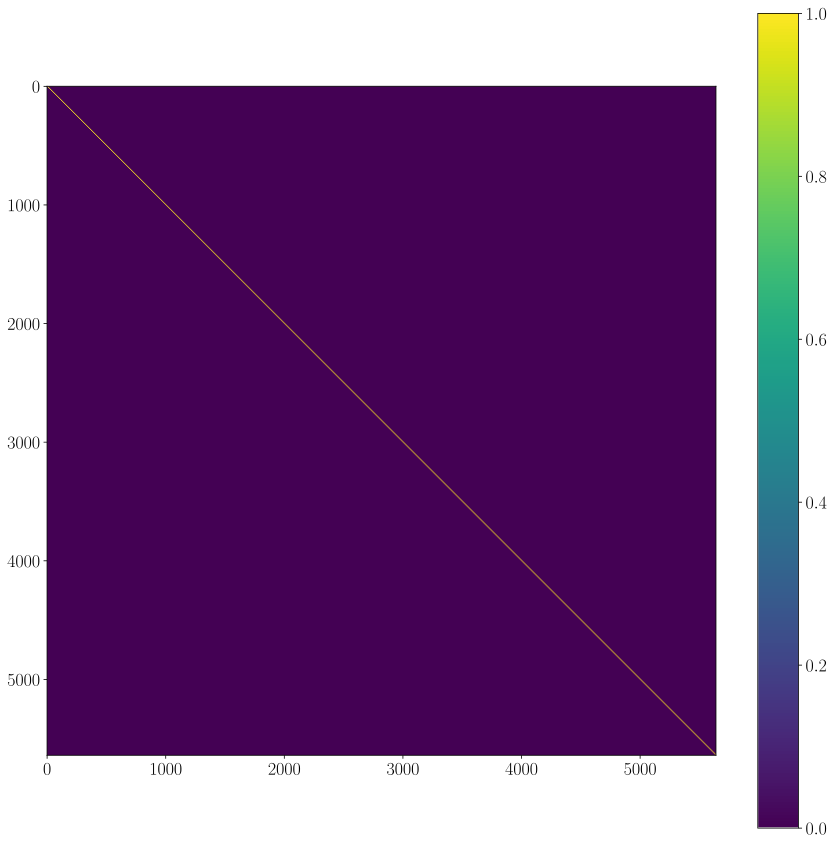

Optimal likelihood: -1461.244
time to train: 22544.22


In [73]:
# train the Generalized Wishart Process

t0 = time.time()
#gwp = GWP(0.01, ou, 1, 0.01, 1) #se
gwp = GWP(0.1, ou, 0, 0.1, 1, use_sum_kernel=True, kernel2=ou, sig_var2=0.1, 
                 tau_prior_mean2=1, tau_prior_var2=0, add_ind_mean=True) #se
samples, diagnostics = gwp.fit(train_data, numit=5000, progress=100, sample_tau=True, sample_L=True, add_ind_mean=True)
#samples, train_post_cov_samples = gwp.draw_samples_prior(train_data, verbose=False, add_ind_mean=True)
t1 = time.time()
print("time to train: {:.02f}".format(t1-t0))

(1500, 4)


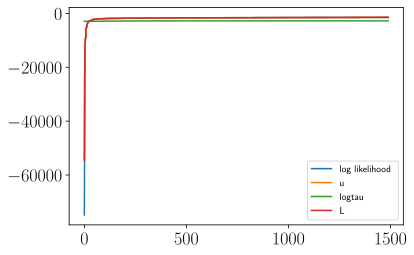

In [74]:
# data_lik, u_prob, logtau_prob, L_prob
#"""
print(np.shape(diagnostics))
diagnostics = np.array(diagnostics)
burnin = 10
plt.plot(diagnostics[burnin:,0], label='log likelihood')
plt.plot(diagnostics[burnin:,1], label='u')
plt.plot(diagnostics[burnin:,2], label='logtau')
plt.plot(diagnostics[burnin:,3], label='L')
plt.legend()
plt.show();
#"""

In [75]:
# compute the covariance matrices for the last 100 samples
num_samples = 100
train_post_cov_samples = gwp.draw_train_samples(num_samples=num_samples, c=10)

#rescale to compare with true covariance
#train_post_cov_samples *= 1/train_post_cov_samples.std()
print(np.shape(train_post_cov_samples))

"""
samples_test = np.array(samples)
u_vector_samples = samples_test[-num_samples: , 0]
L_matrix_samples = samples_test[-num_samples: , 2]
print(np.shape(u_vector_samples))
print(np.shape(L_matrix_samples))

# Sigma(t) = sum_i^nu L u_i(t) u_i(t)^T L^T  ~ W(V, nu)

u_vector_samples = np.concatenate(u_vector_samples)
u_vector_samples = u_vector_samples.reshape(num_samples, N_train, -1, np.shape(L_matrix_samples[0])[0])

cov_matrices_samples = []

for i in range(num_samples):
    u_vector = u_vector_samples[i]
    L_matrix = L_matrix_samples[i]
    cov_matrices_s = []
    for u_t in u_vector:
        cov_prelim = []
        for u_i in u_t:
            #print(np.shape(u_i))
            c_ = np.outer((L_matrix @ u_i), (u_i @ L_matrix.T))
            #print("c_: ", np.shape(c_))
            cov_prelim.append(c_)
        cov_matrices_s.append(np.sum(np.array(cov_prelim), axis=0))
        
        #invert because it's supposed to be an Inverse Wishart Process???
        #TODO: cholesky decomposition
        #C = np.linalg.inv(np.sum(np.array(cov_prelim), axis=0))
        #cov_matrices_s.append(C)
    
    #print(np.shape(cov_matrices_s))
    cov_matrices_samples.append(np.array(cov_matrices_s))
    
print(np.shape(cov_matrices_samples))
"""

(100, 235, 4, 4)


'\nsamples_test = np.array(samples)\nu_vector_samples = samples_test[-num_samples: , 0]\nL_matrix_samples = samples_test[-num_samples: , 2]\nprint(np.shape(u_vector_samples))\nprint(np.shape(L_matrix_samples))\n\n# Sigma(t) = sum_i^nu L u_i(t) u_i(t)^T L^T  ~ W(V, nu)\n\nu_vector_samples = np.concatenate(u_vector_samples)\nu_vector_samples = u_vector_samples.reshape(num_samples, N_train, -1, np.shape(L_matrix_samples[0])[0])\n\ncov_matrices_samples = []\n\nfor i in range(num_samples):\n    u_vector = u_vector_samples[i]\n    L_matrix = L_matrix_samples[i]\n    cov_matrices_s = []\n    for u_t in u_vector:\n        cov_prelim = []\n        for u_i in u_t:\n            #print(np.shape(u_i))\n            c_ = np.outer((L_matrix @ u_i), (u_i @ L_matrix.T))\n            #print("c_: ", np.shape(c_))\n            cov_prelim.append(c_)\n        cov_matrices_s.append(np.sum(np.array(cov_prelim), axis=0))\n        \n        #invert because it\'s supposed to be an Inverse Wishart Process???\n    

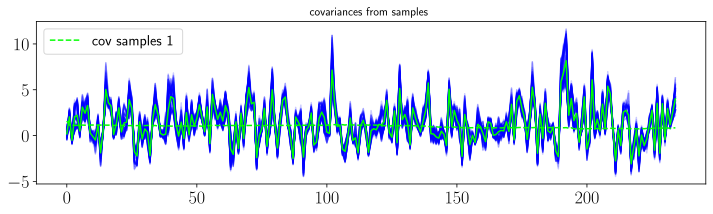

In [76]:
# plot the covariances
cov_matrices_samples = np.array(train_post_cov_samples)


cov_samples_0 = cov_matrices_samples[:,:,0,0]
cov_samples_1 = cov_matrices_samples[:,:,0,1]
cov_samples_2 = cov_matrices_samples[:,:,0,2]
cov_samples_3 = cov_matrices_samples[:,:,0,3]

cov_samples_0_mean = np.mean(cov_samples_0, 0)
cov_samples_1_mean = np.mean(cov_samples_1, 0)
cov_samples_2_mean = np.mean(cov_samples_2, 0)
cov_samples_3_mean = np.mean(cov_samples_3, 0)

plt.figure(figsize=(12, 3))
legend_size = 15

for i in range(num_samples):
    #plt.plot(cov_samples_0[i], color ='blue', alpha=0.2)
    plt.plot(cov_samples_1[i], color ='blue', alpha=0.2)#, label="sample_1")
    #plt.plot(cov_samples_2[i], color ='blue', alpha=0.2)#, label="sample_2")
    #plt.plot(cov_samples_3[i], color ='blue', alpha=0.2)#, label="sample_3")
plt.title("covariances from samples")

# plot mean 

# compare to empirical covariance
#plt.plot(cov_samples_emp_0, '--', label='cov samples 0', color'black)
plt.plot(cov_samples_emp_1, '--', label='cov samples 1', color='lime')
#plt.plot(cov_samples_emp_2, '--', label='cov samples 2', color='yellow')
#plt.plot(cov_samples_emp_3, '--', label='cov samples 3', color='red')
#plt.plot(cov_samples_0_mean, color='black')
plt.plot(cov_samples_1_mean, color='lime')
#plt.plot(cov_samples_2_mean, color='yellow')
#plt.plot(cov_samples_3_mean, color='red')

plt.legend(prop={'size': legend_size});
plt.show();

(100, 235, 4, 4)
(100, 235, 4, 4)


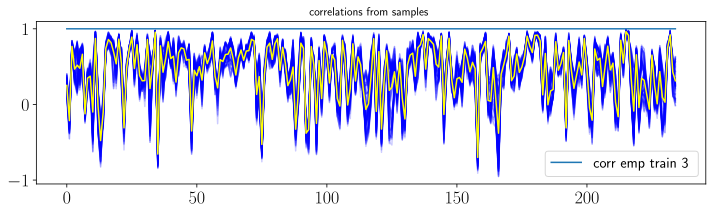

In [77]:
# plot correlations from last 100 samples

# plot sample correlations
cov_matrices_samples = np.array(cov_matrices_samples)
print(np.shape(cov_matrices_samples))
corr_samples = np.zeros_like(cov_matrices_samples)
print(np.shape(corr_samples))

# compute the empirical correlations from the empirical covariances in a smart numpy way
for i in range(np.shape(cov_matrices_samples)[-1]):
    for j in range(np.shape(cov_matrices_samples)[-1]):
        corr_samples[:,:,i,j] = cov_matrices_samples[:,:,i,j] / (np.sqrt(cov_matrices_samples[:,:,i,i]) * np.sqrt(cov_matrices_samples[:,:,j,j]))
        

# plot the results and compare with above
corr_samples_0 = corr_samples[:,:,0,0]
corr_samples_1 = corr_samples[:,:,0,1]
corr_samples_2 = corr_samples[:,:,0,2]
corr_samples_3 = corr_samples[:,:,0,3]

corr_samples_1_mean = np.mean(corr_samples_1, 0)
corr_samples_2_mean = np.mean(corr_samples_2, 0)
corr_samples_3_mean = np.mean(corr_samples_3, 0)

plt.figure(figsize=(12, 3))
legend_size = 15

for i in range(num_samples):
    #plt.plot(corr_samples_1[i], color ='blue', alpha=0.2)#, label="sample_1")
    #plt.plot(corr_samples_2[i], color ='blue', alpha=0.2)#, label="sample_2")
    plt.plot(corr_samples_3[i], color ='blue', alpha=0.2)#, label="sample_3")
plt.title("correlations from samples")

# plot mean 

# compare to empirical correlation
#plt.plot(corr_emp_train_1, label="corr emp train 1")
#plt.plot(corr_emp_train_2, label="corr emp train 2")
plt.plot(corr_emp_train_3, label="corr emp train 3")
#plt.plot(corr_samples_1_mean, color='yellow')
#plt.plot(corr_samples_2_mean, color='yellow')
plt.plot(corr_samples_3_mean, color='yellow')

plt.legend(prop={'size': legend_size});
plt.show();